# Loading and plotting data

This notebook showcases how to load and plot data that was previously generated using the `creator.py` script.

In [10]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
import xarray as xr
import matplotlib as mpl

from causaldynamics.scm import create_scm_graph
from causaldynamics.plot import animate_3d_trajectories, plot_trajectories, plot_scm


All relevant data is stored in a single dataset for easy access. Let's load it and look at the content:

In [3]:
# TODO: Update the path to the data
ds = xr.load_dataset("/Users/herdeanu/kausable/causaldynamics/data/simplex/noise=0.50_confounder=True/data/Lorenz84_N10_T1000.nc")
ds

<xarray.Dataset> Size: 20kB
Dimensions:           (time: 300, node: 5, dim: 3, node_in: 5, node_out: 5,
                       dim_in: 3, dim_out: 3)
Coordinates:
  * time              (time) int32 1kB 0 1 2 3 4 5 6 ... 294 295 296 297 298 299
  * node_in           (node_in) int32 20B 0 1 2 3 4
  * node_out          (node_out) int32 20B 0 1 2 3 4
  * node              (node) int32 20B 0 1 2 3 4
  * dim_in            (dim_in) int32 12B 0 1 2
  * dim_out           (dim_out) int32 12B 0 1 2
  * dim               (dim) int32 12B 0 1 2
Data variables:
    time_series       (time, node, dim) float32 18kB -3.835 22.67 ... 15.32
    adjacency_matrix  (node_in, node_out) float32 100B 0.0 0.0 0.0 ... 1.0 0.0
    weights           (node, dim_in, dim_out) float32 180B -0.5456 ... 0.618
    biases            (node, dim) float32 60B 0.4179 -1.807 ... 1.521 1.114
    magnitudes        (node) float32 20B 3.085 3.66 1.897 3.054 1.764
    root_nodes        (node) bool 5B False True True False True
    time_lag          int32 4B 0

The data is stored in the `Data variables`. To get the data, e.g. the time_series, you can index it like a dictionary. 

In [4]:
time_series = ds["time_series"]
time_series 

<xarray.DataArray 'time_series' (time: 300, node: 5, dim: 3)> Size: 18kB
array([[[ -3.834978 ,  22.665356 ,   2.3784218],
        [ -8.612008 , -13.233146 ,  18.068874 ],
        [ -9.575588 , -14.713776 ,  20.090563 ],
        [ -1.7360729,  -4.0617895,   2.0580192],
        [ -5.747755 ,  -8.831957 ,  12.059379 ]],

       [[ -5.210847 ,  22.52468  ,   1.649559 ],
        [ -9.334746 , -14.293701 ,  19.182257 ],
        [-10.356625 , -15.566172 ,  21.530159 ],
        [ -1.350967 ,  -3.8355923,   1.4960574],
        [ -6.2699304, -10.114052 ,  12.424409 ]],

       [[ -6.2021337,  22.350624 ,   1.1075126],
        [-10.098809 , -15.26269  ,  20.549433 ],
        [-11.135607 , -16.239023 ,  23.209742 ],
        [ -0.9987706,  -3.6991835,   0.9689653],
        [ -6.9035015, -11.4679785,  12.984244 ]],

       ...,

       [[ 14.590815 ,  45.652866 ,   7.8219476],
        [ -3.3780932,  -5.473375 ,  15.941121 ],
        [ -9.855448 , -15.961556 ,  18.849785 ],
        [ -7.5148363, -10.384801 ,   7.9456377],
        [ -2.8487377,  -4.191176 ,  16.15069  ]],

       [[ 13.698618 ,  45.760998 ,   5.4708695],
        [ -3.7107105,  -6.0390267,  15.614613 ],
        [-10.785438 , -16.99935  ,  20.622574 ],
        [ -6.965618 ,  -9.766529 ,   7.368199 ],
        [ -3.0695345,  -4.6621914,  15.708117 ]],

       [[ 12.891257 ,  45.680946 ,   2.9536939],
        [ -4.0810437,  -6.677163 ,  15.365414 ],
        [-11.715551 , -17.812042 ,  22.707478 ],
        [ -6.414616 ,  -9.164305 ,   6.7832227],
        [ -3.3292518,  -5.189312 ,  15.322218 ]]],
      shape=(300, 5, 3), dtype=float32)
Coordinates:
  * time     (time) int32 1kB 0 1 2 3 4 5 6 7 ... 293 294 295 296 297 298 299
  * node     (node) int32 20B 0 1 2 3 4
  * dim      (dim) int32 12B 0 1 2

Let's plot the time series.

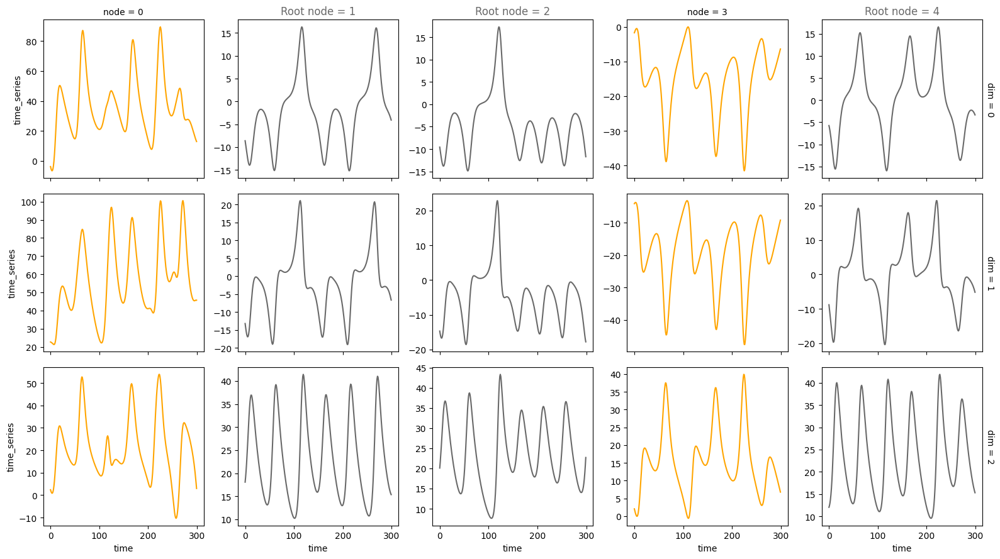

In [5]:
root_nodes = ds["root_nodes"]
plot_trajectories(time_series, root_nodes=root_nodes, sharey=False, node_color="orange", root_node_color="dimgrey")

The adjacency matrix encodes the SCM graph structure. The first dimension are the incoming nodes and the second dimension are the outgoing nodes.

In [6]:
A = ds["adjacency_matrix"]
A

<xarray.DataArray 'adjacency_matrix' (node_in: 5, node_out: 5)> Size: 100B
array([[0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.]], dtype=float32)
Coordinates:
  * node_in   (node_in) int32 20B 0 1 2 3 4
  * node_out  (node_out) int32 20B 0 1 2 3 4

In [7]:
# You can access the underlying numpy array directly by calling .data
print(A.data)
# You can also convert it to a pandas DataFrame
print(A.to_dataframe())

[[0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]]
                  adjacency_matrix
node_in node_out                  
0       0                      0.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
1       0                      1.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
2       0                      1.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
3       0                      1.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
4       0                      0.0
        1                      0.0
        2                      0.0
        3                      1.0

Let's visualize the graph

(<Axes: title={'center': 'Structural Causal Model'}>,
 {0: array([ 0.19040298, -0.4336854 ]),
  1: array([0.74426205, 0.41151592]),
  2: array([0.6018516 , 0.03802172]),
  3: array([-0.53651663, -0.54202374]),
  4: array([-1.        ,  0.52617151])})

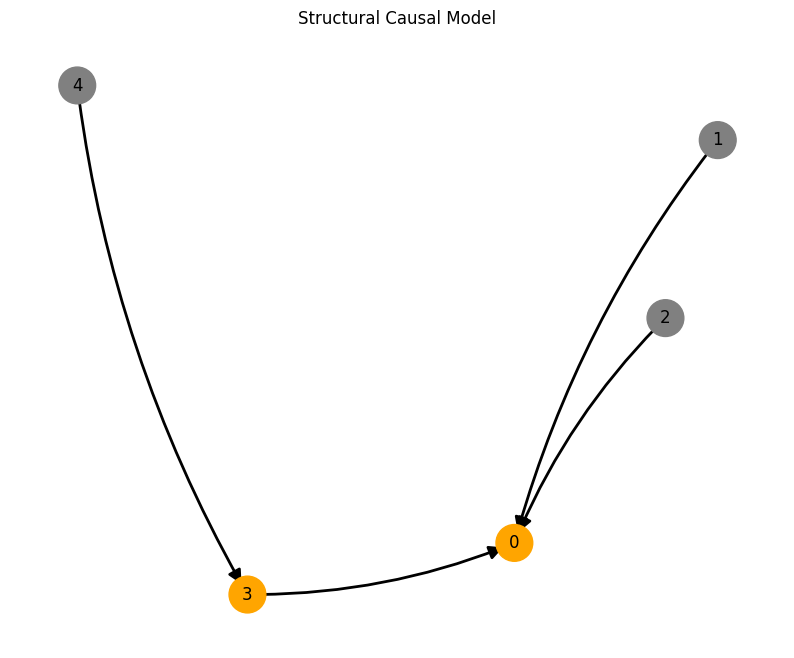

In [8]:
G = create_scm_graph(A.data)
plot_scm(G, root_nodes=root_nodes)


In [9]:
# Creating an animation of the trajectories. 
# This may take a while to run...
mpl.rcParams["animation.embed_limit"] = 50 * 1024**2  # Increase the limit to 50MB

animate_3d_trajectories(time_series, 
                        root_nodes=root_nodes, 
                        plot_type="subplots",
                        frame_skip=5, 
                        rotation_speed=0.2, 
                        rotate=True, 
                        show_history=True, 
                        save_path=None, 
                        return_html_anim=True, # perfect for use in notebooks :)
                        show_plot=False,
                        root_node_alpha=0.5,
                        node_alpha=0.5,
                        linewidth=1.5)